# Анализ пространственных данных. Домашнее задание №2

Мягкий дедлайн: __4 ноября 2020 г. 23:59__

Жесткий дедлайн (со штрафом в _50%_ от количества набранных вами за ДЗ баллов): __5 ноября 2020 г. 08:59__

Визуализация "чего-либо" __без__ выполненного основного задания оценивается в __0 баллов__

ФИО: `Наумовский Алексей Александрович`

Группа: `DS-12`

## Задание №1. Горячая точка (алгоритм - 10 баллов, визуализация - 10 баллов).

Генерируйте рандомные точки на планете Земля до тех пор, пока не попадете на территорию ``Афганистана``

1. Вы можете использовать функции принадлжености точки полигону и расстояния от точки до полигона (в метрах)
2. Предложите не наивный алгоритм поиска (генерировать __напрямую__ точку из полигона границ Афганистана __запрещено__)

Визуализируйте пошагово предложенный алгоритм при помощи ``Folium``

### 1.1 Packages

In [1]:
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

from shapely.geometry import Point, Polygon
import shapely.geometry as geometry
from shapely.ops import linemerge, unary_union, polygonize
import geog
import pandas as pd
import folium
import numpy as np
from functools import reduce
import random
import haversine as hs
from haversine import Unit
import geopy.geocoders
from OSMPythonTools.nominatim import Nominatim
from OSMPythonTools.overpass import Overpass
import requests
import json
import sys
import overpy
import geopandas as gpd
import osmnx as ox
import shapely.geometry
from tqdm._tqdm_notebook import tqdm
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
import warnings
warnings.filterwarnings("ignore")
ox.config(log_console=True, use_cache=True)

### 1.2 Procedures

In [3]:
def draw_map_dest_source_countries(state_geo, SOURCE_COUNTRY, DEST_COUNTRY, country_source, country_dest,\
                                   curr_country_point, ls_coords, df_points):
    
    style = {'fillColor': '#e07b39', 'lineColor': '#00FFFFFF'}
    m = folium.Map(location=[30, 70],zoom_start=2)

    folium.Choropleth(
        geo_data=state_geo,
        name='World',
        fill_color='beige',
        fill_opacity=0.7,
        line_opacity=0.5,
        legend_name='WORD MAP'
    ).add_to(m)

    folium.GeoJson(country_source.geometry, name=SOURCE_COUNTRY).add_to(m)
    folium.GeoJson(country_dest.geometry, name=DEST_COUNTRY, style_function = lambda x: style).add_to(m)
    
    tooltip = SOURCE_COUNTRY
    folium.Marker(location=[curr_country_point.x, curr_country_point.y], 
                  popup='<i>'+str(SOURCE_COUNTRY)+'</i>', 
                  icon=folium.Icon(color='darkgreen', icon='glyphicon glyphicon-home'),
                  tooltip=tooltip).add_to(m)
    m.add_child(folium.LatLngPopup());
    
    for row in ls_coords:
        folium.Circle(
            radius=100,
            location=[row[0], row[1]],
            popup='The Waterfront',
            color='green',
            fill=False,
        ).add_to(m)
        
    for idx, row in df_points.iterrows():
        folium.Circle(
            radius=500,
            location=[row['lat'], row['lon']],
            popup='The Waterfront',
            color='crimson',
            fill=False,
        ).add_to(m)

    folium.LayerControl().add_to(m);
    return m

In [4]:
def toExtent(xmin,ymin,xmax,ymax):
 LL=Point(xmin,ymin)
 UL=Point(xmin,ymax)
 UR=Point(xmax,ymax)
 LR=Point(xmax,ymin)
 array=[LL,UL,UR,LR]
 polygon=Polygon(array)
 return polygon

In [5]:
def unpackTuple(tup): 
    return tuple(reduce(np.append, tup)) 

def generate_random_point(polygon):
    '''Generate random point on given polygon'''
    if isinstance(polygon, Polygon):
        minx, miny, maxx, maxy = polygon.bounds
    elif isinstance(polygon, folium.folium.Map):
        minx, miny, maxx, maxy = unpackTuple(polygon.get_bounds())
    elif isinstance(polygon, tuple):
        minx, miny, maxx, maxy = polygon
    random_point = Point(random.uniform(minx, maxx), random.uniform(miny, maxy))
    return random_point

In [6]:
def find_country_geojson_by_name(country_name :str):
    for cur in state_data['features']:
        if (cur['properties']['name'] == country_name):
            return cur

In [7]:
def get_polygon_from_geojson(dict_geojson):
    return Polygon(dict_geojson['geometry']['coordinates'][0])

In [8]:
def get_haversine_distance_meters(p_from, p_to):
    return hs.haversine((p_from.x, p_from.y), (p_to.x, p_to.y), unit=Unit.METERS)

In [9]:
def get_circle_polygon_around_point(point, radius):
    n_points = 180
    angles = np.linspace(0, 360, n_points)
    return shapely.geometry.Polygon(geog.propagate(Point(point.y,point.x), angles, radius))

### 1.3 DEMO (first step algorithm)

#### 1.3.1 Load World map and choose country('Afghanistan')

In [10]:
SOURCE_COUNTRY = 'Afghanistan';

In [11]:
url = 'https://raw.githubusercontent.com/python-visualization/folium/master/examples/data'
state_geo = f'{url}/world-countries.json'
state_data = pd.read_json(state_geo)

In [12]:
curr_country_geo_json = find_country_geojson_by_name(SOURCE_COUNTRY)
curr_country_polygon = get_polygon_from_geojson(curr_country_geo_json)
curr_country_centr = curr_country_polygon.centroid;
curr_country_point = Point(curr_country_centr.y, curr_country_centr.x)

In [13]:
world_polygon = Polygon(toExtent(-85.6, -180.0, 83.6, 180.0))
world_polygon.bounds

(-85.6, -180.0, 83.6, 180.0)

#### 1.3.2 Example random point - for DEMO

In [19]:
first_random_point = generate_random_point(world_polygon)
print(first_random_point.x, first_random_point.y)

13.019152209296351 175.43511054640368


#### 1.3.3 Visualization DEMO

In [20]:
m = folium.Map(location=[50, 0],zoom_start=1)
folium.GeoJson(get_circle_polygon_around_point(first_random_point, 
         get_haversine_distance_meters(first_random_point, curr_country_point)), name='New_random_polygon').add_to(m)

folium.Choropleth(
    geo_data=state_geo,
    name='World',
    fill_color='beige',
    fill_opacity=0.7,
    line_opacity=0.5,
    legend_name='WORD MAP'
).add_to(m)

folium.Choropleth(
    geo_data=curr_country_geo_json,
    name=SOURCE_COUNTRY,
    fill_color='Green',
    fill_opacity=0.7,
    line_opacity=1,
    line_color = 'Black',
    legend_name=SOURCE_COUNTRY
).add_to(m)

folium.LayerControl().add_to(m);

In [21]:
tooltip = SOURCE_COUNTRY
folium.Marker(location=[curr_country_point.x, curr_country_point.y], 
              popup='<i>'+str(SOURCE_COUNTRY)+'</i>', 
              icon=folium.Icon(color='darkgreen', icon='glyphicon glyphicon-home'),
              tooltip=tooltip).add_to(m)
m.add_child(folium.LatLngPopup());

In [22]:
tooltip = (round(first_random_point.x,3), round(first_random_point.y,3))
folium.Marker(location=[first_random_point.x, first_random_point.y], 
              popup='<i>First point</i>', 
              icon=folium.Icon(color='red', icon='glyphicon glyphicon-log-in'),
              tooltip=tooltip).add_to(m)
m

### 1.4. Algorithm find country

1. Генерируем ранодомную точку в полигоне поиска(на первой итерации - вся карта мира)
2. определяем расстояние до искомой точки
3. определяем принадлежность искомому полигону(если принадлежит - выходим, иначе - идем дальше)
4. создаем новый полигон поиска, радиусом = расстоянию(п.2) вокруг рандомной точки 
5. снова повторяем все шаги с п.1()

In [23]:
def find_country(world_polygon, MAX_ITER=500):
    df_iterations = pd.DataFrame(columns=['iter_num','lat','lon','distance_m','cur_polygon','dest_polygon', 'within'])
    abort_flag = True
    iter_num = 1
    status = ''
    prev_distance = 1000000000
    try_count = 0;
    while(abort_flag):
        if (1 == iter_num):
             curr_polygon = world_polygon
        curr_ranodm_point = generate_random_point(curr_polygon)
        curr_distance = get_haversine_distance_meters(curr_ranodm_point, curr_country_point)
        curr_random_point_yx = Point(curr_ranodm_point.y, curr_ranodm_point.x)
        curr_with_in = curr_random_point_yx.within(curr_country_polygon)
        abort_flag = not curr_with_in
        df_iterations.loc[iter_num] = [iter_num, curr_ranodm_point.x, curr_ranodm_point.y, 
                             curr_distance, curr_polygon, curr_country_polygon, curr_with_in]
        if (curr_with_in):
            status = 'DONE'
            break
        if (curr_distance < prev_distance or try_count == 5):
            curr_polygon = get_circle_polygon_around_point(curr_ranodm_point, curr_distance)
            prev_distance = curr_distance
            try_count = 0
        iter_num = iter_num + 1
        try_count = try_count + 1
        if iter_num == MAX_ITER:
            abort_flag = False
            status = 'MAX_ITER limit'
    print(f'Count iterations:{iter_num}, status:{status}')
    return df_iterations

In [24]:
ATTEMPT = 10
MAX_ITER = 500
cur_iter = MAX_ITER
for at in range(1, ATTEMPT + 1):
    df_temp = find_country(world_polygon, MAX_ITER)
    if (cur_iter > df_temp.shape[0]):
        cur_iter = df_temp.shape[0]
        df_best = df_temp
del df_temp        

Count iterations:41, status:DONE
Count iterations:106, status:DONE
Count iterations:94, status:DONE
Count iterations:500, status:MAX_ITER limit
Count iterations:238, status:DONE
Count iterations:208, status:DONE
Count iterations:500, status:MAX_ITER limit
Count iterations:500, status:MAX_ITER limit
Count iterations:251, status:DONE
Count iterations:500, status:MAX_ITER limit


In [25]:
df_best.tail()

,iter_num,lat,lon,distance_m,cur_polygon,dest_polygon,within
37,37,-34.511505,59.670091,7.631528e+06,"POLYGON ((85.84752513594614 44.61418397719657,...","POLYGON ((61.210817 35.650072, 62.230651 35.27...",False
38,38,63.024075,61.453132,3.259360e+06,"POLYGON ((85.84752513594614 44.61418397719657,...","POLYGON ((61.210817 35.650072, 62.230651 35.27...",False
39,39,69.169941,86.253412,4.122029e+06,"POLYGON ((112.517223300904 50.9952122735722, 1...","POLYGON ((61.210817 35.650072, 62.230651 35.27...",False
40,40,215.359072,46.405606,1.820916e+07,"POLYGON ((112.517223300904 50.9952122735722, 1...","POLYGON ((61.210817 35.650072, 62.230651 35.27...",False
41,41,32.164252,66.315076,1.893595e+05,"POLYGON ((112.517223300904 50.9952122735722, 1...","POLYGON ((61.210817 35.650072, 62.230651 35.27...",True


### 1.5. Visualization algorithm steps

In [26]:
m = folium.Map(location=[50, 0],zoom_start=1)
for idx, row in df_best.iterrows():
     folium.GeoJson(row['cur_polygon'], name='Polygon'+str(idx + 1)).add_to(m)
folium.Choropleth(
    geo_data=state_geo,
    name='World',
    fill_color='beige',
    fill_opacity=0.7,
    line_opacity=0.5,
    legend_name='WORD MAP'
).add_to(m)

folium.Choropleth(
    geo_data=curr_country_geo_json,
    name=SOURCE_COUNTRY,
    fill_color='Green',
    fill_opacity=0.7,
    line_opacity=1,
    line_color = 'Black',
    legend_name=SOURCE_COUNTRY
).add_to(m)

folium.LayerControl().add_to(m);

In [27]:
tooltip = SOURCE_COUNTRY
folium.Marker(location=[curr_country_point.x, curr_country_point.y], 
              popup='<i>'+str(SOURCE_COUNTRY)+'</i>', 
              icon=folium.Icon(color='darkgreen', icon='glyphicon glyphicon-home'),
              tooltip=tooltip).add_to(m)
m.add_child(folium.LatLngPopup());

In [28]:
for idx, row in df_best.iterrows():
    p_cur = Point(row['lat'],row['lon'])
    tooltip = str(idx + 1) 
    folium.Marker(location=[row['lat'], row['lon']], 
                  popup='<i>' + str((round(row['lat'],3), round(row['lon'],3))) + ' point</i>', 
                  icon=folium.Icon(color='red', icon='glyphicon glyphicon-log-in'),
                  tooltip=tooltip).add_to(m)
m

## Задание №2. Качество жизни (20 баллов).

Для измерения показателя качества жизни в точке, найденной в предыдущем задании, вам необходимо рассчитать следующую сумму расстояний (в метрах):

1. Расстояние от точки до 5 ближайших __*__ банкоматов, находящихся в стране с наибольшим количеством объектов жилой недвижимости
2. Расстояние от точки до 5 ближайших школ, находящихся в стране с наибольшим количеством аптек в столице
3. Расстояние от точки до 5 ближайших кинотеатров, наодящихся в стране с самым большим отношением числа железнодорожных станций к автобусным остановкам в южной части __**__

__*__ При поиске _N_ ближайших объектов обязательно использовать ``R-tree``

__**__ Южной частью страны является территория, находящаяся к югу от множества точек, равноудаленных от самой северной и самой южной точек страны

## 2.1. PART 1

### 2.1.1. Procedures

In [29]:
def get_name_country_by_coords(coord):
    location = geolocator.reverse(coord, exactly_one=True)
    address = location.raw['address']
    country = address.get('country', '')
    return country

In [30]:
def total_residential_by_areaid(areaid :int):
    areaid_ = areaid
    if (areaid_ < 3600000000):
        areaid_ = areaid_ + 3600000000;
    overpass_url = "http://overpass-api.de/api/interpreter"
    overpass_query = """
    [out:json][timeout:1000];
    area(""" + str(areaid_) + """);
    foreach->.regio(
    ( 
      node(area.regio)["residential"="urban"];
          node(area.regio)["residential"="rural"];
          node(area.regio)["residential"="apartments"];
          way(area.regio)["residential"="urban"];
          way(area.regio)["residential"="rural"];
          way(area.regio)["residential"="apartments"];
          relation(area.regio)["residential"="urban"];
          relation(area.regio)["residential"="rural"];
          relation(area.regio)["residential"="apartments"];);
    );
    /*added by auto repair*/
    (._;>;);
    /*end of auto repair*/
    out count;
    """
    try:
        response = requests.get(overpass_url, 
                            params={'data': overpass_query})
        data = response.json()
        return int(data['elements'][0]['tags']['total'])
    except Exception:
        return 0

### 2.1.2. Prev task Point

In [31]:
prev_task_point = Point(df_best.iloc[-1]['lat'], df_best.iloc[-1]['lon'])
prev_task_point.xy

(array('d', [32.164252374036295]), array('d', [66.31507553985813]))

In [32]:
geolocator = geopy.geocoders.Nominatim(user_agent="AlexNaumovski")
print(get_name_country_by_coords("32.37052386906629, 63.481933186545916"))

Afghanistan


### 2.1.3. Get list all counties

In [33]:
overpass = Overpass()
overpass_areas_list = overpass.query('relation["admin_level"="2"];out;')
overpass_areas_list.countRelations()

321

### 2.1.4. Find counties (areaid % 10 == 0) and MAX TOTAL by "Key:residential"

In [36]:
max_residential = 0
cur_residential_country = 0
max_residential_country = ""
idx = 0

In [37]:
df_all_counties = pd.DataFrame(columns = ['areaid','country_name','total_residential'])

In [38]:
for cur_area in tqdm(overpass_areas_list.relations()):
    if (cur_area.id() % 10 == 0):
        if (cur_area.tag('name:en') != None):
            cur_residential_country = total_residential_by_areaid(cur_area.id())
            df_all_counties.loc[idx] = [cur_area.id(), cur_area.tag('name:en'), cur_residential_country]
            idx = idx + 1
            if (cur_residential_country > max_residential):
                max_residential = cur_residential_country
                max_residential_country = cur_area.tag('name:en')

In [39]:
max_residential_country

'Brazil'

### 2.1.5. Find all ATM points 

In [41]:
DEST_COUNTRY_1 = max_residential_country
nominatim = Nominatim()
DEST_COUNTRY_AREAID_1 = nominatim.query(DEST_COUNTRY_1).areaId()

In [42]:
overpass_url = "http://overpass-api.de/api/interpreter"
overpass_query_atm = """
[out:json][timeout:100];
area("""+str(DEST_COUNTRY_AREAID_1)+""");
(
 nw[amenity=atm](area);
);
out geom;
"""
data_atm = requests.get(overpass_url, 
                        params={'data': overpass_query_atm}).json()

In [43]:
atm_coords = []
for ii, cur_atm in enumerate(data_atm['elements']):
    if (cur_atm['type'] == 'node'):
        atm_coords.append((cur_atm['lat'],cur_atm['lon']))
    if (cur_atm['type'] == 'way'):
        atm_coords.append((cur_atm['bounds']['minlat'],cur_atm['bounds']['minlon']))

### 2.1.6. Visualization check

In [44]:
country_source = ox.geocode_to_gdf(SOURCE_COUNTRY)
country_source_proj = ox.project_gdf(country_source)

In [45]:
country_dest = ox.geocode_to_gdf(DEST_COUNTRY_1)
country_dest_proj = ox.project_gdf(country_dest)

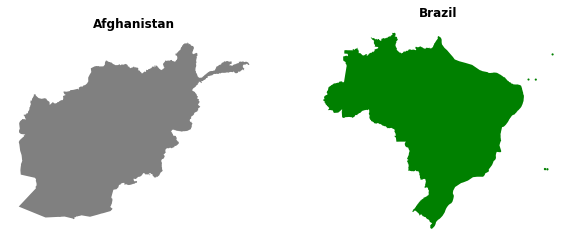

In [46]:
f, axes = plt.subplots(1,2, figsize=(10,5))
country_source_proj.plot(fc='gray', ec='none',ax=axes[0])
country_dest_proj.plot(fc='green', ec='none',ax=axes[1])
_ = axes[0].axis('off'), axes[0].set_title(SOURCE_COUNTRY)
_ = axes[1].axis('off'), axes[1].set_title(DEST_COUNTRY_1)


### 2.1.7. Rtree (5 nearest ATM)

In [47]:
from rtree import index
atm_rtree_idx = index.Index()
atm_rtree_idx

rtree.index.Index(bounds=[1.7976931348623157e+308, 1.7976931348623157e+308, -1.7976931348623157e+308, -1.7976931348623157e+308], size=0)

In [48]:
for i, cur_point in enumerate(atm_coords):
    atm_rtree_idx.add(i, Point(cur_point).bounds)

In [49]:
nearest_points_idx_list =list(atm_rtree_idx.nearest(prev_task_point.bounds, num_results=5, objects=False))
nearest_points_idx_list

[335, 336, 343, 337, 338]

In [50]:
df_atm_points = pd.DataFrame(columns=['rtree_idx','lat','lon', 'geometry', 'distance'])

In [51]:
for idx, cur_idx_point in enumerate(nearest_points_idx_list):
    cur_point = Point(atm_coords[cur_idx_point]) 
    cur_distance = get_haversine_distance_meters(prev_task_point, cur_point)
    df_atm_points.loc[idx] = [cur_idx_point, atm_coords[cur_idx_point][0], atm_coords[cur_idx_point][1],\
                            cur_point, cur_distance]                           

### (1) Cумма расстояний (в метрах) от точки до 5 ближайших банкоматов, находящихся в стране с наибольшим количеством объектов жилой недвижимости: 

In [52]:
df_atm_points

,rtree_idx,lat,lon,geometry,distance
0,335,-3.840601,-32.410944,POINT (-3.8406011 -32.4109438),1.105582e+07
1,336,-3.841433,-32.410996,POINT (-3.8414331 -32.4109961),1.105587e+07
2,343,-3.849353,-32.425885,POINT (-3.8493531 -32.4258847),1.105774e+07
3,337,-3.856503,-32.428587,POINT (-3.8565028 -32.4285865),1.105842e+07
4,338,-3.856536,-32.428589,POINT (-3.8565364 -32.4285886),1.105842e+07


In [53]:
df_atm_points['distance'].sum()

55286268.11792242

In [54]:
m = draw_map_dest_source_countries(state_geo, SOURCE_COUNTRY, DEST_COUNTRY_1, country_source,
                               country_dest, curr_country_point, atm_coords, df_atm_points)
m

### 2.2. PART 2

### 2.2.1. Procedures

In [55]:
def get_capital_by_areaid(areaid :int):
    areaid_ = areaid
    if (areaid_ < 3600000000):
        areaid_ = areaid_ + 3600000000;
    overpass_url = "http://overpass-api.de/api/interpreter"
    overpass_query = """
    [out:json][timeout:100];
    area("""+ str(areaid_) +""")->.searchArea;
    relation["admin_level"="2"]["type"="boundary"]["boundary"="administrative"];
    node(r:"admin_centre");
    node._(area.searchArea);
    out geom;
    """
    
    try:
        data = requests.get(overpass_url, params={'data': overpass_query}).json()
        return data['elements'][0]['tags']
    except Exception:
        return None

In [56]:
def get_count_pharmacy_by_areaid(areaid :int):
    overpass_url = "http://overpass-api.de/api/interpreter"
    overpass_query_pharmacy = """
    [out:json][timeout:1000];
    area("""+ str(areaid) +""");
    (
     nw[amenity=pharmacy](area);
    );
    /*added by auto repair*/
    (._;>;);
    /*end of auto repair*/
    out count;
    """
    try:
        data_pharmacy = requests.get(overpass_url, 
                            params={'data': overpass_query_pharmacy}).json()
        return int(data_pharmacy['elements'][0]['tags']['total'])
    except Exception:
        return 0   

### 2.2.2. Find all capitals

In [57]:
for i, row in tqdm(df_all_counties.iterrows(), total=df_all_counties.shape[0]):
    cur_capital_data = get_capital_by_areaid(row['areaid'])
    filter_by_areaid = df_all_counties.areaid==row['areaid']
    if (cur_capital_data is None):
        df_all_counties.loc[(df_all_counties.areaid==row['areaid']), 'capital_en'] = 'None'
    else:
        df_all_counties.loc[(filter_by_areaid), 'capital_en'] = cur_capital_data['name:en']
        df_all_counties.loc[(filter_by_areaid), 'capital_areaid'] = nominatim.query(cur_capital_data['name:en']).areaId();

In [58]:
df_all_counties.loc[:,('areaid')]= df_all_counties['areaid'].\
            apply(lambda x : x + 3600000000 if x < 3600000000 else x)

In [59]:
f = (df_all_counties.areaid == df_all_counties.capital_areaid)
df_all_counties = df_all_counties.drop(df_all_counties[f].index)

In [60]:
df_all_counties_no_nan = df_all_counties.dropna()
df_all_counties_no_nan

,areaid,country_name,total_residential,capital_en,capital_areaid
3,3600079510,Estonia,278,Tallinn,3.602165e+09
8,3600184640,Bangladesh,0,Dhaka,3.610250e+09
9,3600184840,Syria,0,Damascus,3.600186e+09
10,3600192780,Liberia,1084,Monrovia,3.609320e+09
11,3600192790,Central African Republic,1071,Bangui,3.607323e+09
12,3600192800,Ethiopia,0,Addis Ababa,3.601708e+09
17,3600287670,Honduras,0,Tegucigalpa,3.603851e+09
18,3600295480,Portugal,3953,Lisbon,3.605401e+09
19,3600364110,Azerbaijan,0,Baku,3.603765e+09
20,3600449220,Taiwan,0,Taipei,3.601293e+09


### 2.2.3. Find Capital where MAX count pharmacy

In [61]:
df_all_counties_no_nan.loc[:,'capital_pharmacy_cnt'] = pd.Series(0, index=df_all_counties_no_nan.index)

In [62]:
for i, row in tqdm(df_all_counties_no_nan.iterrows(), total=df_all_counties_no_nan.shape[0]):
    cur_cap_areaid = row['capital_areaid']
    df_all_counties_no_nan.loc[(df_all_counties_no_nan.index == i), ['capital_pharmacy_cnt']] = get_count_pharmacy_by_areaid(cur_cap_areaid)

In [63]:
df_all_counties_no_nan.loc[df_all_counties_no_nan['capital_pharmacy_cnt'].idxmax()]

areaid                   3600287670
country_name               Honduras
total_residential                 0
capital_en              Tegucigalpa
capital_areaid          3.60385e+09
capital_pharmacy_cnt            533
Name: 17, dtype: object

In [64]:
DEST_COUNTRY_2 = df_all_counties_no_nan.loc[df_all_counties_no_nan['capital_pharmacy_cnt'].idxmax()][1]
DEST_COUNTRY_AREAID_2 = nominatim.query(DEST_COUNTRY_2).areaId()

[nominatim] downloading data: Honduras


In [65]:
country_dest_2 = ox.geocode_to_gdf(DEST_COUNTRY_2)
country_dest_proj_2 = ox.project_gdf(country_dest_2)

### 2.2.4. Find Schools

In [66]:
overpass_url = "http://overpass-api.de/api/interpreter"
overpass_query_school = """
[out:json][timeout:100];
area(""" + str(DEST_COUNTRY_AREAID_2) + """);
(
 nw["amenity"="school"](area);
);
out geom;
"""
data_school = requests.get(overpass_url, 
                        params={'data': overpass_query_school}).json()

In [67]:
school_coords = []
for ii, cur_school in enumerate(data_school['elements']):
    if (cur_school['type'] == 'node'):
        school_coords.append((cur_school['lat'],cur_school['lon']))
    if (cur_school['type'] == 'way'):
        school_coords.append((cur_school['bounds']['minlat'],cur_school['bounds']['minlon']))

### 2.2.5. Rtree (5 nearest School)

In [68]:
school_rtree_idx = index.Index()
school_rtree_idx

rtree.index.Index(bounds=[1.7976931348623157e+308, 1.7976931348623157e+308, -1.7976931348623157e+308, -1.7976931348623157e+308], size=0)

In [69]:
for i, cur_point in enumerate(school_coords):
    school_rtree_idx.add(i, Point(cur_point).bounds)

In [70]:
nearest_points_idx_list =list(school_rtree_idx.nearest(prev_task_point.bounds, num_results=5, objects=False))
nearest_points_idx_list

[884, 838, 885, 888, 886]

In [71]:
df_school_points = pd.DataFrame(columns=['rtree_idx','lat','lon', 'geometry', 'distance'])

In [72]:
for idx, cur_idx_point in enumerate(nearest_points_idx_list):
    cur_point = Point(school_coords[cur_idx_point]) 
    cur_distance = get_haversine_distance_meters(prev_task_point, cur_point)
    df_school_points.loc[idx] = [cur_idx_point, school_coords[cur_idx_point][0], school_coords[cur_idx_point][1],\
                            cur_point, cur_distance]

### (2) Cумма расстояний (в метрах) от точки до 5 ближайших школ, находящихся в стране с наибольшим количеством аптек в столице: 

In [73]:
df_school_points

,rtree_idx,lat,lon,geometry,distance
0,884,15.263928,-83.773352,POINT (15.2639282 -83.7733515),1.385404e+07
1,838,15.263298,-83.774134,POINT (15.2632977 -83.77413369999999),1.385414e+07
2,885,15.266983,-83.775027,POINT (15.2669828 -83.7750273),1.385384e+07
3,888,15.255921,-83.780161,POINT (15.2559207 -83.7801607),1.385517e+07
4,886,15.264175,-83.786317,POINT (15.2641747 -83.7863172),1.385472e+07


In [74]:
df_school_points['distance'].sum()

69271908.78289026

In [75]:
m = draw_map_dest_source_countries(state_geo, SOURCE_COUNTRY, DEST_COUNTRY_2, country_source,
                               country_dest_2, curr_country_point, school_coords, df_school_points)
m

### 2.3. PART 3

### 2.3.1 Procedures

In [76]:
def get_train_to_bus_coef_by_areaid(areaid :int):
    areaid_ = areaid
    if (areaid_ < 3600000000):
        areaid_ = areaid_ + 3600000000;
    overpass_url = "http://overpass-api.de/api/interpreter"
    overpass_query = """
     [out:json][timeout:200];
        area("""+ str(areaid_) +""");
    (
      nwr["building"="train_station"](area)->.t;
      nwr["highway"="bus_stop"](area)->.b;
      
      make out train_station_cnt = (t.count(nodes) + t.count(ways) + t.count(relations));
      make out bus_stop_cnt = (b.count(nodes) + b.count(ways) + b.count(relations));
    );
    out;
    """
    
    try:
        data = requests.get(overpass_url, params={'data': overpass_query}).json()
        train_cnt = data['elements'][-2:][0]['tags']['train_station_cnt']
        bus_cnt = data['elements'][-2:][1]['tags']['bus_stop_cnt']
        if train_cnt is None:
            train_cnt = 0
        if (bus_cnt is None):
            bus_cnt = 1  
        if (int(bus_cnt) == 0):
            bus_cnt = 1            
        return (int(train_cnt), int(bus_cnt))
    except Exception:
        return (0,1)

### 2.3.2 Find coef MAX(train_station/bus_stop) 
#### <span style="color:red"> условие: "Расстояние  в южной части" - сделать не смог</span>

In [77]:
for i, row in tqdm(df_all_counties.iterrows(), total=df_all_counties.shape[0]):
    cur_tuple_train_bus = list(get_train_to_bus_coef_by_areaid(row['areaid']))
#     print(row['areaid'], cur_tuple_train_bus)
    df_all_counties.loc[(df_all_counties.index == i), 'train_bus_coef'] = cur_tuple_train_bus[0]/cur_tuple_train_bus[1]

In [78]:
df_all_counties.loc[df_all_counties['train_bus_coef'].idxmax()]

areaid               3600192830
country_name           Cameroon
total_residential            68
capital_en                 None
capital_areaid              NaN
train_bus_coef        0.0869565
Name: 13, dtype: object

In [79]:
DEST_COUNTRY_3 = df_all_counties.loc[df_all_counties['train_bus_coef'].idxmax()][1]
DEST_COUNTRY_AREAID_3 = nominatim.query(DEST_COUNTRY_3).areaId()

In [80]:
country_dest_3 = ox.geocode_to_gdf(DEST_COUNTRY_3)
country_dest_proj_3 = ox.project_gdf(country_dest_3)

### 2.3.3. Find cinema

In [81]:
overpass_url = "http://overpass-api.de/api/interpreter"
overpass_query_cinema = """
[out:json][timeout:100];
area(""" + str(DEST_COUNTRY_AREAID_3) + """);
(
 nw["amenity"="cinema"](area);
);
out geom;
"""
data_cinema = requests.get(overpass_url, 
                        params={'data': overpass_query_cinema}).json()

In [82]:
cinema_coords = []
for ii, cur_cinema in enumerate(data_cinema['elements']):
    if (cur_cinema['type'] == 'node'):
        cinema_coords.append((cur_cinema['lat'],cur_cinema['lon']))
    if (cur_cinema['type'] == 'way'):
        cinema_coords.append((cur_cinema['bounds']['minlat'],cur_cinema['bounds']['minlon']))

### 2.3.4. Rtree (5 nearest Cinema)

In [83]:
cinema_rtree_idx = index.Index()
cinema_rtree_idx

rtree.index.Index(bounds=[1.7976931348623157e+308, 1.7976931348623157e+308, -1.7976931348623157e+308, -1.7976931348623157e+308], size=0)

In [84]:
for i, cur_point in enumerate(cinema_coords):
    cinema_rtree_idx.add(i, Point(cur_point).bounds)

In [85]:
nearest_points_idx_list =list(cinema_rtree_idx.nearest(prev_task_point.bounds, num_results=5, objects=False))
nearest_points_idx_list

[3, 1, 6, 5, 4]

In [86]:
df_cinema_points = pd.DataFrame(columns=['rtree_idx','lat','lon', 'geometry', 'distance'])

In [87]:
for idx, cur_idx_point in enumerate(nearest_points_idx_list):
    cur_point = Point(cinema_coords[cur_idx_point]) 
    cur_distance = get_haversine_distance_meters(prev_task_point, cur_point)
    df_cinema_points.loc[idx] = [cur_idx_point, cinema_coords[cur_idx_point][0], cinema_coords[cur_idx_point][1],\
                            cur_point, cur_distance]

### (3) Cумма расстояний (в метрах) от точки до 5 ближайших кинотеатров, наодящихся в стране с самым большим отношением числа железнодорожных станций к автобусным остановкам: 

#### <span style="color:red"> условие: "Расстояние  в южной части" - сделать не смог</span>

In [88]:
df_cinema_points

,rtree_idx,lat,lon,geometry,distance
0,3,9.303187,13.394006,POINT (9.303187100000001 13.3940057),5.989221e+06
1,1,7.320644,13.578874,POINT (7.3206435 13.5788742),6.095194e+06
2,6,3.859312,11.496311,POINT (3.8593124 11.4963109),6.505180e+06
3,5,4.058563,9.723055,POINT (4.0585633 9.7230553),6.652539e+06
4,4,4.054465,9.714845,POINT (4.0544647 9.7148448),6.653545e+06


In [89]:
df_cinema_points['distance'].sum()

31895678.798720773

In [90]:
m = draw_map_dest_source_countries(state_geo, SOURCE_COUNTRY, DEST_COUNTRY_3, country_source,
                               country_dest_3, curr_country_point, cinema_coords, df_cinema_points)
m

## Задание №3. Поездка по Нью-Йорку (маршрут - 20 баллов, визуализация - 10 баллов).

Добраться __на автомобиле__ от входа в ``Central Park`` __Нью-Йорка__ (со стороны ``5th Avenue``) до пересечения ``Water Street`` и ``Washington Street`` в Бруклине (откуда получаются лучшие фото Манхэттенского моста) довольно непросто - разумеется, из-за вечных пробок. Однако еще сложнее это сделать, проезжая мимо школ, где дети то и дело переходят дорогу в неположенном месте.

Вам необходимо построить описанный выше маршрут, избегая на своем пути школы. Визуализируйте данный маршрут (также добавив школы и недоступные для проезда участки дорог) при помощи ``Folium``

Данные о расположении школ Нью-Йорка можно найти [здесь](https://catalog.data.gov/dataset/2019-2020-school-point-locations)

### 3.1. Polygon NY

In [91]:
ny_gdf = ox.geocode_to_gdf('New York, USA')
ny_gdf_proj = ox.project_gdf(ny_gdf, to_crs = 'EPSG:4326')

In [92]:
ny_all_bounds = str(ny_gdf.bounds['miny'][0]) + ',' + str(ny_gdf.bounds['minx'][0]) + ',' +\
                str(ny_gdf.bounds['maxy'][0]) + ',' + str(ny_gdf.bounds['maxx'][0])
ny_all_bounds

'40.477399,-74.25909,40.9161785,-73.7001809'

### 3.2. Central Park

In [93]:
ny_central_park_gdf = ox.geocode_to_gdf('Central Park, New York, USA')
ny_central_park_gdf_proj = ox.project_gdf(ny_central_park_gdf, to_crs = 'EPSG:4326')

In [94]:
ny_bounds = str(ny_central_park_gdf.bounds['miny'][0]) + ',' + str(ny_central_park_gdf.bounds['minx'][0]) + ',' +\
            str(ny_central_park_gdf.bounds['maxy'][0]) + ',' + str(ny_central_park_gdf.bounds['maxx'][0])
ny_bounds

'40.7647452,-73.9814075,40.8003135,-73.9496061'

In [95]:
overpass_url = "http://overpass-api.de/api/interpreter"
overpass_query = """
[out:json][timeout:800];
(
  way[highway][name="Central Park Outer Loop"]("""+ ny_bounds +""");
)->.park; 
(
  way[highway][name="5th Avenue"]("""+ ny_bounds +""");
)->.avenue; 
(
  node.park(around.avenue:30);
  way.park(around.avenue:30);
  rel.park(around.avenue:30);
)->.park_avenue; 
(.avenue; - .park_avenue;);
out center;
"""
data_ny_point = requests.get(overpass_url, 
                        params={'data': overpass_query}).json()

In [96]:
count_points = len(data_ny_point['elements'])
ny_central_park_point = Point(data_ny_point['elements'][int(count_points/2)]['center']['lat'],
                        data_ny_point['elements'][int(count_points/2)]['center']['lon'])

In [97]:
print(ny_central_park_point)

POINT (40.766772 -73.971189)


### 3.3. Brooklyn

In [98]:
ny_brooklyn_gdf = ox.geocode_to_gdf('Brooklyn, New York, USA')
ny_brooklyn_gdf_proj = ox.project_gdf(ny_brooklyn_gdf, to_crs = 'EPSG:4326')

In [99]:
br_bounds = str(ny_brooklyn_gdf.bounds['miny'][0]) + ',' + str(ny_brooklyn_gdf.bounds['minx'][0]) + ',' +\
            str(ny_brooklyn_gdf.bounds['maxy'][0]) + ',' + str(ny_brooklyn_gdf.bounds['maxx'][0])
br_bounds

'40.5700235,-74.0419691,40.7394026,-73.8556336'

In [100]:
overpass_url = "http://overpass-api.de/api/interpreter"
overpass_query = """
[out:json][timeout:800];
way["highway"]["name"="Water Street"]("""+ br_bounds +""")->.w1;
way["highway"]["name"="Washington Street"]("""+ br_bounds +""")->.w2;
node(w.w1)(w.w2);
out geom;
"""
data_br_point = requests.get(overpass_url, 
                        params={'data': overpass_query}).json()

In [101]:
ny_brooklyn_point = Point(data_br_point['elements'][0]['lat'],
                        data_br_point['elements'][0]['lon'])

In [102]:
ny_brooklyn_point.x, ny_brooklyn_point.y

(40.7032012, -73.98958)

### 3.4. Schools NY

In [103]:
url_school = 'https://data.cityofnewyork.us/api/views/a3nt-yts4/rows.json'
school_data = requests.get(url_school).json()

In [104]:
columns_schools = ['c' +str(i) for i in range(1, 32)]
df_schools_ny = pd.DataFrame(data=school_data['data'], columns=columns_schools)
df_schools_ny.rename(columns={'c9':'geometry'}, inplace=True)

In [105]:
df_schools_ny['xy'] = df_schools_ny['geometry'].str.replace('POINT ','').\
            astype(str).str.replace('(','').str.replace(')','').str.split()
df_schools_ny['lat'] = df_schools_ny['xy'].apply(lambda x: np.float64(x[0]))
df_schools_ny['lon'] = df_schools_ny['xy'].apply(lambda x: np.float64(x[1]))

In [106]:
gpd_schools_ny = gpd.GeoDataFrame(df_schools_ny,\
                                  geometry=gpd.points_from_xy(df_schools_ny.lon, df_schools_ny.lat))
gpd_schools_ny.crs = ny_gdf.crs

### 3.5. VISUALIZATION BEFORE

In [107]:
m = folium.Map(location=[40.7, -74],zoom_start=10)

folium.Choropleth(
    geo_data=ny_gdf,
    name='NY',
    fill_color='beige',
    fill_opacity=0.1,
    line_opacity=1,
    legend_name='NY'
).add_to(m)

SOURCE_POSITION = 'Central Park'
folium.Choropleth(
    geo_data=ny_central_park_gdf,
    name=SOURCE_POSITION,
    fill_color='green',
    fill_opacity=0.1,
    line_opacity=1,
    legend_name=SOURCE_POSITION
).add_to(m)
tooltip = SOURCE_POSITION
folium.Marker(location=[ny_central_park_point.x, ny_central_park_point.y], 
              icon=folium.Icon(color='darkgreen', icon='glyphicon glyphicon-tree-deciduous'),
              tooltip=tooltip).add_to(m)

DEST_POSITION = 'Brooklyn'
folium.Choropleth(
    geo_data=ny_brooklyn_gdf,
    name=DEST_POSITION,
    fill_color='purple',
    fill_opacity=0.1,
    line_opacity=1,
    legend_name=DEST_POSITION
).add_to(m)
tooltip = DEST_POSITION
folium.Marker(location=[ny_brooklyn_point.x, ny_brooklyn_point.y], 
              icon=folium.Icon(color='purple', icon='glyphicon glyphicon-flag'),
              tooltip=tooltip).add_to(m)

for cur_school in gpd_schools_ny['geometry']:
    folium.Circle(
        radius=50,
        location=[cur_school.x, cur_school.y],
        color='red',
        fill=False,
    ).add_to(m)

folium.LayerControl().add_to(m)
m.add_child(folium.LatLngPopup())
m

### 3.6. Create drive network graph

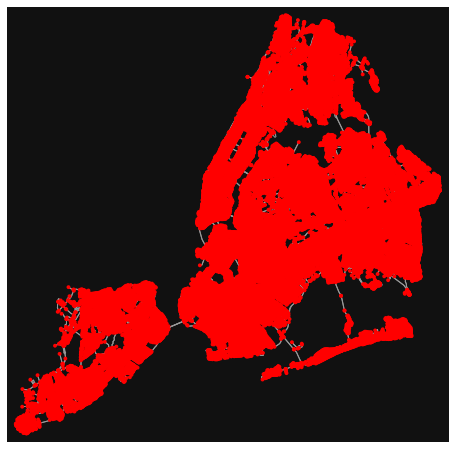

In [108]:
G = ox.graph_from_polygon(ny_gdf.geometry[0], network_type ='drive')
fig, ax = ox.plot_graph(G, node_color='r')

### 3.7. Find shortest way

In [109]:
origin_point = (ny_central_park_point.x, ny_central_park_point.y) 
destination_point = (ny_brooklyn_point.x, ny_brooklyn_point.y)
# get the nearest nodes to the locations 
origin_node = ox.get_nearest_node(G, origin_point) 
destination_node = ox.get_nearest_node(G, destination_point)

In [110]:
# Finding the optimal path 
route = ox.shortest_path(G, origin_node, destination_node, weight = 'length') 
route[:5]

[42429970, 42456683, 42436510, 4347534783, 5706568771]

In [111]:
# getting coordinates of the nodes
# we will store the longitudes and latitudes in following list 
shortest_lon = [] 
shortest_lat = []  
for i in route:
     point = G.nodes[i]
     shortest_lon.append(point['x'])
     shortest_lat.append(point['y'])

### 3.8. VISUALIZATION AFTER

In [112]:
m = folium.Map(location=[40.75, -74],zoom_start=12)

folium.Choropleth(
    geo_data=ny_gdf,
    name='NY',
    fill_color='beige',
    fill_opacity=0.1,
    line_opacity=1,
    legend_name='NY'
).add_to(m)

SOURCE_POSITION = 'Central Park'
folium.Choropleth(
    geo_data=ny_central_park_gdf,
    name=SOURCE_POSITION,
    fill_color='green',
    fill_opacity=0.1,
    line_opacity=1,
    legend_name=SOURCE_POSITION
).add_to(m)
tooltip = SOURCE_POSITION
folium.Marker(location=[ny_central_park_point.x, ny_central_park_point.y], 
              icon=folium.Icon(color='darkgreen', icon='glyphicon glyphicon-tree-deciduous'),
              tooltip=tooltip).add_to(m)

DEST_POSITION = 'Brooklyn'
folium.Choropleth(
    geo_data=ny_brooklyn_gdf,
    name=DEST_POSITION,
    fill_color='purple',
    fill_opacity=0.1,
    line_opacity=1,
    legend_name=DEST_POSITION
).add_to(m)
tooltip = DEST_POSITION
folium.Marker(location=[ny_brooklyn_point.x, ny_brooklyn_point.y], 
              icon=folium.Icon(color='purple', icon='glyphicon glyphicon-flag'),
              tooltip=tooltip).add_to(m)

for cur_school in gpd_schools_ny['geometry']:
    folium.Circle(
        radius=50,
        location=[cur_school.x, cur_school.y],
        color='red',
        fill=False,
    ).add_to(m)
    
folium.PolyLine(zip(shortest_lat,shortest_lon), color="blue", weight=3, opacity=1).add_to(m)
folium.LayerControl().add_to(m)
m.add_child(folium.LatLngPopup())
m

### TEMP

In [113]:
overpass_url = "http://overpass-api.de/api/interpreter"
overpass_query = """
[out:json][timeout:800];
(
  way[amenity=school]("""+ ny_all_bounds +""");
  node[amenity=school]("""+ ny_all_bounds +""");
  rel[amenity=school]("""+ ny_all_bounds +""");
)->.schools;
 
(way(around.schools:130)[highway]
  ["highway"~"^(primary|secondary|trunk|tertiary|motorway)$"]("""+ ny_all_bounds +""");)->.street;

(way["highway"~"^(primary|secondary|trunk|tertiary|motorway)$"]("""+ ny_all_bounds +""");)->.streets2;

(.streets2; - .street;);

out geom;
"""
data_streets = requests.get(overpass_url, 
                        params={'data': overpass_query}).json()

In [114]:
streets_coords = []
for ii, cur_el in enumerate(data_streets['elements']):
    if (cur_el['type'] == 'node'):
        streets_coords.append((cur_node['lat'],cur_node['lon']))
    if (cur_el['type'] == 'way'):
        for cur_node in cur_el['geometry']:
            streets_coords.append((cur_node['lat'],cur_node['lon']))

In [115]:
def create_point(x, y):
    return Point(x, y)

In [116]:
df_streets_points = pd.DataFrame(list(streets_coords), columns=['x','y']).apply(lambda v: create_point(v.x, v.y), axis = 1)

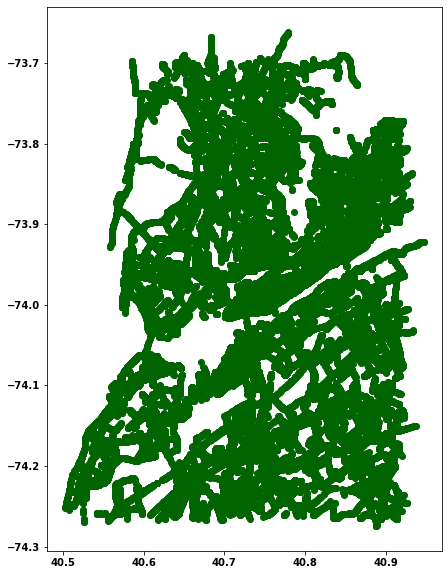

In [117]:
fig, ax = plt.subplots(1,1, figsize=(10,10))
gpd.GeoDataFrame(df_streets_points, columns=['geometry']).plot(color='darkgreen',ax=ax);